In [16]:
import os

import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import sys
sys.path.append("../src/")
from data import AccidentData

import matplotlib.pyplot as plt
from utils import *

from data import AccidentData
import geopandas as gpd

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score

import warnings 
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
def get_data(clean: bool = False, recreate_clean: bool = False) -> pd.DataFrame:
    if not clean:
        if not os.path.exists("../data/data_brut.csv"):
            accident_data: AccidentData = AccidentData()
            df = accident_data.get_merge_df(2005, 2021)
            df.to_csv("../data/data_brut.csv", index=False)
            return df
        df = pd.read_csv("../data/data_brut.csv")
        return df

    if recreate_clean or not os.path.exists("../data/brut_data_clean.csv"):
        df = get_data(clean=False)
        df = clean_data(df)
        return df
    df = pd.read_csv("../data/brut_data_clean.csv")
    return df


def clean_data(df: pd.DataFrame) -> pd.DataFrame:
    df["prof"] = df["prof"].replace(
        {
            -1: np.nan,
            0: 1,
        }
    )

    df["lum"] = df["lum"].replace({1: 0, 2: 1, 5: 1, 3: 2, 4: 2})
    df["int"] = df["int"].replace(
        {-1: np.nan, 0: np.nan, 1: 0, 2: 1, 3: 1, 4: 1, 5: 1, 6: 2, 7: 2, 8: 3, 9: 3}
    )

    df["atm"] = df["atm"].replace(
        {-1: np.nan, 1: 0, 2: 1, 8: 1, 7: 2, 5: 2, 3: 3, 4: 3, 6: 3, 9: 3}
    )

    df["circ"] = df["circ"].replace({-1: np.nan, 1: 0, 2: 1, 3: 2, 4: 3})

    df["plan"] = df["plan"].replace(
        {
            -1: np.nan,
            1: 0,
            2: 1,
            3: 1,
            4: 2,
        }
    )
    df["vosp"] = df["vosp"].replace({-1: np.nan, 0: 0, 3: 1, 2: 2, 1: 3})
    df["surf"] = df["surf"].replace(
        {-1: np.nan, 1: 0, 2: 1, 3: 1, 4: 2, 5: 2, 6: 2, 7: 2, 8: 3, 9: 3}
    )
    all_features: list = [
        "prof",
        "plan",
        "vosp",
        "grav",
        "lum",
        "dep",
        "com",
        "int",
        "date",
        "lat",
        "long",
        "atm",
        "circ",
        "nbv",
        "larrout",
        "vma",
        "surf",
        "catv",
        "Num_Acc",
    ]
    df = df[all_features]
    df.to_csv("../data/brut_data_clean.csv", index=False)
    return df

In [3]:
df: pd.DataFrame = get_data(clean=True, recreate_clean=True)

In [49]:
# get data after 2019
df_after_2019 = df[df["date"] >= pd.to_datetime("2019-01-01")].drop(["larrout", "vma"],axis=1)
Num_Acc =  df_after_2019[df_after_2019["catv"] == 1]["Num_Acc"]
df_velo_acc = df_after_2019[df_after_2019["Num_Acc"].isin(list(Num_Acc))]
df_velo_acc.reset_index(drop=True, inplace=True) 
df_after_2019.drop(["Num_Acc"], axis=1, inplace=True)
df_after_2019.dropna(inplace=True)
df_after_2019.reset_index(drop=True, inplace=True)
for col in df_after_2019.columns:
    if col == "lat" or col == "long":
        df_after_2019[col] = df_after_2019[col].apply(lambda x: str(x).replace(",",".")).astype(float)
    elif col != "date" and col != "dep" and col != "com":
        df_after_2019[col] = df_after_2019[col].astype(int)
df_after_2019

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,surf,catv
0,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,7
1,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,17
2,4,1,0,1,2,93,93066,0,2019-11-30,48.930700,2.368800,0,0,2,0,7
3,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
4,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262664,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262665,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262666,1,1,0,2,0,33,33003,1,2021-01-01,44.954275,-0.517921,0,1,2,1,7
262667,1,0,0,2,2,78,78423,0,2021-01-02,48.796670,2.050500,3,1,2,1,7


In [56]:
import folium
from folium.plugins import MarkerCluster

def make_map(df):
    #Create the base Map
    m = folium.Map(location=[48.866667,2.333333], tiles='OpenStreetMap', zoom_start=12)
    #markerCluster = MarkerCluster().add_to(m)
    for i, row in df.iterrows():
        lat = df.at[i,'lat']
        lng = df.at[i,'long']
        folium.CircleMarker(location=[lat, lng], radius=2).add_to(m)
    m.save("paris_bike_acc.html")

print("saving map")
make_map(df_after_2019[(df_after_2019["dep"] == "75") | (df_after_2019["dep"] == "750")])

saving map


In [50]:
df_after_2019.to_csv("../data/df_after_2019.csv", index=False)

In [ ]:
for feature in selected_features:
    df_velo_acc_predictions[feature] = df_velo_acc_predictions[feature].astype("Int64")

Accuracy: 0.588518060705947


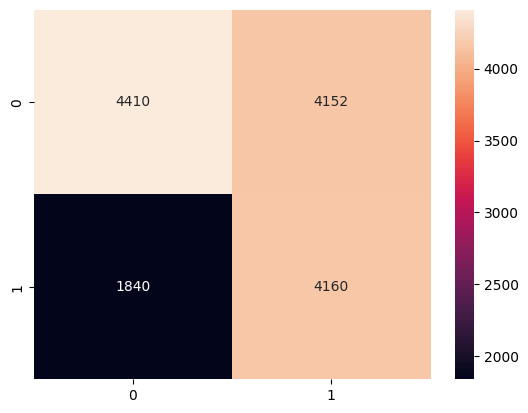

In [9]:
import math
from datetime import date
df_drop = df.dropna(subset=["larrout"])
df_drop["larrout"] = df_drop["larrout"].apply(lambda x: int(round(float(x.replace(',','.').strip()))) if isinstance(x, str) else int(round(x)))

df_drop = df_drop[(df_drop.date <= date(2019, 12, 31)) & (df_drop.larrout >= 20)]
df_drop["larrout"] = df_drop["larrout"]//10

Num_Acc =  df_drop[df_drop["catv"] == 1]["Num_Acc"]
df_velo_acc = df_drop[df_drop["Num_Acc"].isin(list(Num_Acc))]
df_velo_acc.reset_index(drop=True, inplace=True) 

columns_to_drop_for_predictions: list = [
    "dep",
    "com",
    "date",
    "lat",
    "long",
    "vma",
    "catv",
    "Num_Acc",
    "lum",
    "atm",
    "surf",
    "circ",
    "nbv",
]

df_velo_acc_predictions: pd.DataFrame = df_velo_acc.drop(columns=columns_to_drop_for_predictions)

selected_features = ["prof","plan","vosp","grav","int", "larrout"]
for feature in selected_features:
    df_velo_acc_predictions[feature] = df_velo_acc_predictions[feature].astype("Int64")

df_velo_acc_predictions = df_velo_acc_predictions.dropna()

features_to_one_hot = ["prof","int"]
df_velo_acc_predictions = pd.get_dummies(df_velo_acc_predictions, columns=features_to_one_hot)

X = df_velo_acc_predictions.drop(columns=["grav"])
y = df_velo_acc_predictions["grav"].astype("int").astype("int").replace({1: 0, 2: 1, 3: 1})

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train.astype('int'), y_train.astype('int'))

# Create a Gaussian Classifier
clf = LogisticRegression()
clf.fit(X_train_smote, y_train_smote.astype('int'))
y_pred = clf.predict(X_test).astype('int')
print("Accuracy:", accuracy_score(y_test, y_pred))

#from sklearn.metrics import brier_score_loss
#print("Brier score:", brier_score_loss(y_test, y_pred, pos_label=1))

# confusion matrix with seaborn
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

In [57]:
#df_amenagement = gpd.read_file("../data/france-20230101.geojson")
df_amenagement.head(2)

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry
0,geovelo_429754890_86274,429754890,None,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,None,2020-07-28,30.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.00585 47.08621, 0.00575 47.08644..."
1,geovelo_618321946_47165,618321946,3:V80,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2018-08-20,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.02402 44.52984, 0.02409 44.52989)"


In [271]:
list(df_amenagement.iloc[0].geometry.coords)

[(0.005850700000012, 47.0862118),
 (0.0057496, 47.08643619999999),
 (0.0056467, 47.0865687)]

In [277]:
from geopy.distance import geodesic
def get_distance_from_amenagement(row, coords):
    lat = coords[0]
    long = coords[1]
    print(row.head(2))
    for coord in list(row["geometry"].simplify(tolerance=1e-4).coords):
        lat_amenagement = coord[1]
        long_amenagement = coord[0]
    return geodesic((lat, long), (lat_amenagement, long_amenagement)).m

df_amenagement.apply(lambda x: get_distance_from_amenagement(x, [48.896210,2.470120]))

0    geovelo_429754890_86274
1    geovelo_618321946_47165
Name: id_local, dtype: object


KeyError: 'geometry'

In [281]:
from geopy.distance import geodesic
def get_distance_from_amenagement(coords):
    lat = coords[0]
    long = coords[1]
    distances = []
    for i, row in df_amenagement.iterrows():
        print(f"{i}/{df_amenagement.shape[0]}",end="\r")
        for coord in list(row["geometry"].simplify(tolerance=1e-4).coords):
            lat_amenagement = coord[1]
            long_amenagement = coord[0]
            distances.append(geodesic((lat, long), (lat_amenagement, long_amenagement)).m)
    return min(distances)

get_distance_from_amenagement([48.896210,2.470120])

KeyboardInterrupt: 

In [323]:
df_amenagement[df_amenagement['code_com_g'].apply(lambda x: str(x)[:2])=="75"].head(1)

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry,latitude_dep,longitude_dep,latitude_fin,longitude_fin
400,geovelo_941710106_92012,941710106,None,92012,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26120 48.83410, 2.26120 48.83410)",48.834102,2.261204,48.834102,2.261204


In [350]:
import numpy as np
from math import sin, cos, sqrt, atan2, radians, asin
from tqdm import tqdm
import warnings
from geopy.distance import great_circle

warnings.simplefilter('ignore')

def filter_top_nine_citys_only(df_acc_, df_infra_):
    top_nine_citys = ["75"]
    df_infra_["dep_g"] = df_infra_["code_com_g"].apply(lambda x: str(x)[:2])
    df_infra_["dep_d"] = df_infra_["code_com_d"].apply(lambda x: str(x)[:2])
    mask_infra = np.zeros(df_infra_.shape[0]).astype(bool)
    mask_acc = np.zeros(df_acc_.shape[0]).astype(bool)

    for code in top_nine_citys:
        mask_acc = np.logical_or(mask_acc, df_acc_['dep'] == code)
        mask_infra = np.logical_or(mask_infra, np.logical_or(df_infra_['dep_d'] == code, df_infra_['dep_g'] == code))

    df_infra_ = df_infra_[mask_infra]
    df_acc_ = df_acc_[mask_acc]

    return df_acc_.reset_index(drop=True), df_infra_.reset_index(drop=True)

def distance(row, lat_acc, long_acc):
    dist = great_circle((row['latitude_dep'], row['longitude_dep']),(lat_acc, long_acc)).meters
    if dist < 20: 
        return dist
    else:
        return np.nan

def associate_infra_index_to_acc(df_acc, df_infra):
    """ 
    Associate for each accident the index of an infrastructure
    """
    df_acc_ = df_acc.copy()
    df_infra_ = df_infra.copy()

    top_nine_citys = ["75"]

    df_acc_["distance_to_infra"] = np.nan
    df_acc_["infra_index"] = np.nan

    for code in top_nine_citys:
        #Select a sub-dataset (a city) in order to reduce research computations among infrastructure
        mask_acc = df_acc_['dep'] == code
        mask_infra = np.logical_or(df_infra_['dep_d'] == code, df_infra_['dep_g'] == code)
        df_infra_city = df_infra_[mask_infra]
        df_acc_city = df_acc_[mask_acc]
        
        for i_acc in tqdm(range(df_acc_city.shape[0])):
            acc = df_acc_city.iloc[i_acc,:]
            acc_index = df_acc_city.iloc[i_acc:i_acc+1,:].index.values[0] #subtefuge pour obtenir l'index
            lat_acc = acc['lat']
            long_acc = acc['long']
            
            #calcul la distance d'un accident à tout les infrastructure d'une même ville
            dist_series = df_infra_city[['latitude_dep', 'longitude_dep', 'latitude_fin', 'longitude_fin']].apply(distance, axis=1, args =(lat_acc, long_acc))
            
            #Selectionne l'infra la plus proche
            df_acc_.loc[acc_index, "infra_index"] = dist_series.argmin() #reference index of infrastructure
            df_acc_.loc[acc_index, "distance_to_infra"] = dist_series.min()
    
    return df_acc_, df_infra_
    #Usage  : df_acc, df_infra = associate_infra_index_to_acc(df_acc, df_infra)


def merge(df_acc, df_infra):
    df_acc_, df_infra_ = filter_top_nine_citys_only(df_acc, df_infra)
    df_acc, df_infra = associate_infra_index_to_acc(df_acc, df_infra)

    return df_acc, df_infra

In [376]:
df_after_2019

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,surf,catv
0,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,7
1,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,17
2,4,1,0,1,2,93,93066,0,2019-11-30,48.930700,2.368800,0,0,2,0,7
3,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
4,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262664,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262665,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262666,1,1,0,2,0,33,33003,1,2021-01-01,44.954275,-0.517921,0,1,2,1,7
262667,1,0,0,2,2,78,78423,0,2021-01-02,48.796670,2.050500,3,1,2,1,7


In [378]:
mask.sum()

0

In [381]:
geodesic((48.896210,2.470120), (48.896210+0.00005,2.470120+0.00005)).m

6.660240210266465

In [385]:
df_amenagement["latitude_dep"].head(1)

0    47.086212
Name: latitude_dep, dtype: float64

In [388]:
df_amenagement_

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry,latitude_dep,longitude_dep,latitude_fin,longitude_fin,dep_g,dep_d
0,geovelo_941710106_92012,941710106,None,92012,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26120 48.83410, 2.26120 48.83410)",48.834102,2.261204,48.834102,2.261204,75,92
1,geovelo_27067710_75116,27067710,None,75116,BANDE CYCLABLE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,50.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26726 48.86139, 2.26751 48.86163...",48.861393,2.267261,48.861799,2.267691,75,75
2,geovelo_14444302_75115,14444302,None,75115,AUCUN,ZONE 30,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75115,DOUBLE SENS CYCLABLE NON MATERIALISE,ZONE 30,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,None,2020-12-23,30.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.27925 48.83257, 2.27921 48.83251...",48.832573,2.279247,48.832408,2.279156,75,75
3,geovelo_720340021_75115,720340021,None,75115,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,75115,AUCUN,None,None,NaN,None,EN SERVICE,None,None,2022-11-02,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.27886 48.83271, 2.27891 48.83277)",48.832709,2.278863,48.832772,2.278913,75,75
4,geovelo_1061351138_75116,1061351138,None,75116,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,75116,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2022-05-18,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.28098 48.85742, 2.28091 48.85745...",48.857419,2.280977,48.857580,2.280843,75,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9812,geovelo_69921667_75112,69921667,None,94042,COULOIR BUS+VELO,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,None,75112,AUCUN,None,None,NaN,None,EN SERVICE,None,None,2021-04-14,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46263 48.81920, 2.46263 48.81920)",48.819196,2.462630,48.819196,2.462630,75,94
9813,geovelo_64044950_75112,64044950,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,TROTTOIR,EN SERVICE,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,TROTTOIR,EN SERVICE,None,None,2018-07-09,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46464 48.82630, 2.46484 48.82530)",48.826301,2.464644,48.825301,2.464840,75,75
9814,geovelo_95505337_94033,95505337,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,MEUBLE,94033,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,MEUBLE,None,2022-11-02,5.0,False,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46305 48.84225, 2.46305 48.84225)",48.842247,2.463053,48.842247,2.463053,94,75
9815,geovelo_930997491_75112,930997491,None,75112,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75112,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,VELO DE ROUTE,2022-11-30,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46780 48.83572, 2.46801 48.83575...",48.835721,2.467798,48.835937,2.468878,75,75


In [401]:
df_amenagement_

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry,latitude_dep,longitude_dep,latitude_fin,longitude_fin
0,geovelo_429754890_86274,429754890,None,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,None,2020-07-28,30.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.00585 47.08621, 0.00575 47.08644...",47.086212,0.005851,47.086569,0.005647
1,geovelo_618321946_47165,618321946,3:V80,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2018-08-20,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.02402 44.52984, 0.02409 44.52989)",44.529839,0.024023,44.529895,0.024091
2,geovelo_320086926_65440,320086926,None,65440,VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,65440,VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2015-09-16,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.04709 43.22005, 0.04696 43.22039)",43.220046,0.047086,43.220395,0.046962
3,geovelo_1014634279_61001,1014634279,None,61001,AMENAGEMENT MIXTE PIETON VELO HORS VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,61001,AMENAGEMENT MIXTE PIETON VELO HORS VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2021-12-23,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.08711 48.44785, 0.08717 48.44785...",48.447847,0.087109,48.447853,0.087388
4,geovelo_286716581_65047,286716581,None,65047,BANDE CYCLABLE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,65047,BANDE CYCLABLE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,None,2021-08-03,50.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.09498 43.24128, 0.09493 43.24116...",43.241280,0.094978,43.237360,0.093489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
273253,geovelo_221765387_29084,221765387,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2022-08-02,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (-4.95567 48.39763, -4.95496 48.397...",48.397633,-4.955668,48.397923,-4.954941
273254,geovelo_1083122772_29084,1083122772,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2022-08-02,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (-4.95550 48.39718, -4.95548 48.397...",48.397179,-4.955503,48.397633,-4.955668
273255,geovelo_112397599_29084,112397599,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2015-11-12,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (-4.95573 48.39569, -4.95584 48.395...",48.395693,-4.955730,48.395421,-4.956908
273256,geovelo_280464405_29084,280464405,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,29084,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2022-11-29,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (-4.95687 48.39622, -4.95677 48.39628)",48.396220,-4.956872,48.396277,-4.956770


In [399]:
df_after_2019_["lat"]

0         48.896210
1         48.896210
2         48.930700
3         48.935872
4         48.935872
            ...    
262664    44.911210
262665    44.911210
262666    44.954275
262667    48.796670
262668    48.796670
Name: lat, Length: 262669, dtype: float64

In [389]:
for i, row in df_amenagement_.iterrows():
    high_lat = row["geometry"].bounds[3] + 0.00005
    low_lat = row["geometry"].bounds[1] - 0.00005
    high_long = row["geometry"].bounds[2] + 0.00005
    low_long = row["geometry"].bounds[0] - 0.00005

    mask = np.logical_and(np.logical_and(df_after_2019["lat"]<high_lat, df_after_2019["lat"]>low_lat), np.logical_and(df_after_2019["long"]<high_long, df_after_2019["long"]>low_long))
    print(mask.sum())
    break

0


In [391]:
df_after_2019.loc[262664]

prof             2
plan             1
vosp             0
grav             1
lum              2
dep             26
com          26064
int              0
date    2021-01-01
lat       44.91121
long      5.019636
atm              1
circ             1
nbv              2
surf             1
catv             7
Name: 262664, dtype: object

In [390]:
df_after_2019["lat"]

0         48.896210
1         48.896210
2         48.930700
3         48.935872
4         48.935872
            ...    
262664    44.911210
262665    44.911210
262666    44.954275
262667    48.796670
262668    48.796670
Name: lat, Length: 262669, dtype: float64

In [372]:
df_amenagement.geometry.iloc[0].bounds

(0.0056467, 47.0862118, 0.005850700000012, 47.0865687)

In [369]:
type(df_amenagement['geometry'])

geopandas.geoseries.GeoSeries

In [402]:
df_after_2019_,df_amenagement_ =  filter_top_nine_citys_only(df_after_2019_,df_amenagement_)
df_amenagement_ = df_amenagement_[(df_amenagement_['dep_g']=="75") | (df_amenagement_['dep_d']=="75")]

In [420]:
df_amenagement_["amenagement_index"] = np.nan
for i, row in tqdm(df_amenagement_.iterrows()):
    high_lat = row["geometry"].bounds[3] + 0.0005
    low_lat = row["geometry"].bounds[1] - 0.0005
    high_long = row["geometry"].bounds[2] + 0.0005
    low_long = row["geometry"].bounds[0] - 0.0005

    mask = np.logical_and(np.logical_and(df_after_2019_["lat"]<high_lat, df_after_2019_["lat"]>low_lat), np.logical_and(df_after_2019_["long"]<high_long, df_after_2019_["long"]>low_long))
    if df_after_2019_[mask].shape[0] != 0:
        index = df_after_2019_[mask].index[0]
        df_after_2019_.loc[index, "amenagement_index"] = i

9817it [00:34, 282.65it/s]


In [425]:
# create folium map for each coordinates of df_after_2019_
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location=[48.896210,2.470120], zoom_start=12)

for i, row in df_after_2019_.iterrows():
    folium.CircleMarker(location=[row["lat"], row["long"]], radius=2).add_to(m)

m

In [421]:
df_after_2019_.amenagement_index.isna().sum()

20969

In [408]:
df_amenagement_.head(3)

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry,latitude_dep,longitude_dep,latitude_fin,longitude_fin,dep_g,dep_d
0,geovelo_941710106_92012,941710106,None,92012,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26120 48.83410, 2.26120 48.83410)",48.834102,2.261204,48.834102,2.261204,75,92
1,geovelo_27067710_75116,27067710,None,75116,BANDE CYCLABLE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,50.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26726 48.86139, 2.26751 48.86163...",48.861393,2.267261,48.861799,2.267691,75,75
2,geovelo_14444302_75115,14444302,None,75115,AUCUN,ZONE 30,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75115,DOUBLE SENS CYCLABLE NON MATERIALISE,ZONE 30,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,None,2020-12-23,30.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.27925 48.83257, 2.27921 48.83251...",48.832573,2.279247,48.832408,2.279156,75,75


In [403]:
df_after_2019_

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,surf,catv
0,2,0,0,1,1,75,75117,1,2019-10-24,48.883074,2.283707,0,0,4,0,7
1,2,0,0,1,1,75,75117,1,2019-10-24,48.883074,2.283707,0,0,4,0,33
2,1,0,0,1,0,75,75120,1,2019-10-23,48.872928,2.408648,0,1,2,0,33
3,1,0,0,1,0,75,75120,1,2019-10-23,48.872928,2.408648,0,1,2,0,7
4,1,0,0,1,0,75,75111,1,2019-10-23,48.856564,2.394438,0,1,4,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25221,2,0,2,1,0,75,75110,0,2021-01-02,48.876905,2.366594,1,0,1,0,7
25222,2,0,2,1,0,75,75110,0,2021-01-02,48.876905,2.366594,1,0,1,0,1
25223,1,0,0,1,1,75,75110,0,2021-01-01,48.879216,2.368600,0,0,2,0,7
25224,1,0,0,1,1,75,75110,0,2021-01-01,48.879216,2.368600,0,0,2,0,30


In [368]:
df_amenagement['geometry'].iloc[0].bounds[2]

0.005850700000012

In [301]:
df_after_2019 = pd.read_csv("../data/df_after_2019.csv")
df_amenagement = gpd.read_file("../data/france-20230101.geojson")
df_amenagement['latitude_dep'] = list(df_amenagement['geometry'].apply(lambda x: x.coords[0][1]))
df_amenagement['longitude_dep'] = list(df_amenagement['geometry'].apply(lambda x: x.coords[0][0]))
df_amenagement['latitude_fin'] = list(df_amenagement['geometry'].apply(lambda x: x.coords[-1][1]))
df_amenagement['longitude_fin'] = list(df_amenagement['geometry'].apply(lambda x: x.coords[-1][0]))
df_after_2019["dep"] = df_after_2019.dep.apply(lambda x: str(x))

In [398]:
df_after_2019_ = df_after_2019.copy(deep=True)
df_amenagement_ = df_amenagement.copy(deep=True)

In [328]:
df_after_2019_filter, df_amenagement_filter = filter_top_nine_citys_only(df_after_2019_, df_amenagement_)

In [ ]:
import plotly.express as px

lats = np.array([])
lons = np.array([])
for feature in df_amenagement_filter.geometry:
    x, y = feature.coords.xy
    lats = np.append(lats, y)
    lons = np.append(lons, x)
    lats = np.append(lats, None)
    lons = np.append(lons, None)

fig = px.line_geo(lat=lats, lon=lons)

fig.update_layout(mapbox_style="stamen-terrain",
                  mapbox_zoom=12,
                  mapbox_center_lon=2.19,
                  mapbox_center_lat=48.52,
                 )

fig.show()

[(2.261204101723254, 48.83410209872227),
 (2.261204102112408, 48.83410209894825)]

In [ ]:
test_map = folium.Map([48.52,2.19], tiles='Cartodb Positron', zoom_start=15)
for feature in df_amenagement_filter.geometry:
    fg = folium.FeatureGroup("Lines")
    folium.PolyLine(list(feature.coords)).add_to(fg)
    fg.add_to(test_map)
folium.LayerControl(position='bottomright').add_to(test_map)

test_map

In [356]:
import plotly.express as px
d = px.data.gapminder().query("year == 2007")
dfig = px.line_geo(df, locations="iso_alpha",
                  color="continent", # "continent" is one of the columns of gapminder
                  projection="orthographic")
fig.show()

ModuleNotFoundError: No module named 'plotly'

In [355]:
df_amenagement_

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry,latitude_dep,longitude_dep,latitude_fin,longitude_fin,dep_g,dep_d
0,geovelo_941710106_92012,941710106,None,92012,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26120 48.83410, 2.26120 48.83410)",48.834102,2.261204,48.834102,2.261204,75,92
1,geovelo_27067710_75116,27067710,None,75116,BANDE CYCLABLE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,75116,AUCUN,None,None,NaN,None,EN SERVICE,LISSE,None,2022-11-04,50.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.26726 48.86139, 2.26751 48.86163...",48.861393,2.267261,48.861799,2.267691,75,75
2,geovelo_14444302_75115,14444302,None,75115,AUCUN,ZONE 30,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75115,DOUBLE SENS CYCLABLE NON MATERIALISE,ZONE 30,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,LISSE,None,2020-12-23,30.0,True,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.27925 48.83257, 2.27921 48.83251...",48.832573,2.279247,48.832408,2.279156,75,75
3,geovelo_720340021_75115,720340021,None,75115,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,75115,AUCUN,None,None,NaN,None,EN SERVICE,None,None,2022-11-02,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.27886 48.83271, 2.27891 48.83277)",48.832709,2.278863,48.832772,2.278913,75,75
4,geovelo_1061351138_75116,1061351138,None,75116,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,75116,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2022-05-18,NaN,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.28098 48.85742, 2.28091 48.85745...",48.857419,2.280977,48.857580,2.280843,75,75
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9812,geovelo_69921667_75112,69921667,None,94042,COULOIR BUS+VELO,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,None,75112,AUCUN,None,None,NaN,None,EN SERVICE,None,None,2021-04-14,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46263 48.81920, 2.46263 48.81920)",48.819196,2.462630,48.819196,2.462630,75,94
9813,geovelo_64044950_75112,64044950,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,TROTTOIR,EN SERVICE,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,TROTTOIR,EN SERVICE,None,None,2018-07-09,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46464 48.82630, 2.46484 48.82530)",48.826301,2.464644,48.825301,2.464840,75,75
9814,geovelo_95505337_94033,95505337,None,75112,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,MEUBLE,94033,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,CHAUSSEE,EN SERVICE,MEUBLE,None,2022-11-02,5.0,False,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46305 48.84225, 2.46305 48.84225)",48.842247,2.463053,48.842247,2.463053,94,75
9815,geovelo_930997491_75112,930997491,None,75112,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,75112,AUTRE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,VELO DE ROUTE,2022-11-30,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (2.46780 48.83572, 2.46801 48.83575...",48.835721,2.467798,48.835937,2.468878,75,75


In [351]:
df_after_2019_, df_amenagement_ = merge(df_after_2019_.iloc[:100,:], df_amenagement_)

100%|██████████| 100/100 [00:41<00:00,  2.43it/s]


In [354]:
df_after_2019_

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,surf,catv,distance_to_infra,infra_index
0,2,0,0,1,1,75,75117,1,2019-10-24,48.883074,2.283707,0,0,4,0,7,NaN,-1.0
1,2,0,0,1,1,75,75117,1,2019-10-24,48.883074,2.283707,0,0,4,0,33,NaN,-1.0
2,1,0,0,1,0,75,75120,1,2019-10-23,48.872928,2.408648,0,1,2,0,33,9.795217,1421.0
3,1,0,0,1,0,75,75120,1,2019-10-23,48.872928,2.408648,0,1,2,0,7,9.795217,1421.0
4,1,0,0,1,0,75,75111,1,2019-10-23,48.856564,2.394438,0,1,4,0,33,18.668209,7297.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1,1,0,1,2,75,75112,0,2019-02-15,48.821550,2.462080,0,2,8,0,7,NaN,-1.0
96,1,1,0,1,2,75,75112,0,2019-02-15,48.821550,2.462080,0,2,8,0,33,NaN,-1.0
97,2,1,0,1,0,75,75120,0,2019-08-17,48.876274,2.410002,1,0,2,1,7,NaN,-1.0
98,2,1,0,1,0,75,75120,0,2019-08-17,48.876274,2.410002,1,0,2,1,32,NaN,-1.0


In [345]:
df_amenagement_.to_csv("../data/df_amenagement_merged.csv", index=False)

In [346]:
df_after_2019_.to_csv("../data/df_after_2019_merged.csv", index=False)

In [ ]:
def distance(row, lat_acc, long_acc):
    dist = great_circle((row['latitude_dep'], row['longitude_dep']),(lat_acc, long_acc)).meters
    if dist < 20: 
        return dist
    else:
        return np.nan

In [265]:
df_after_2019

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,surf,catv
0,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,7
1,1,1,0,1,2,93,93053,0,2019-11-30,48.896210,2.470120,0,2,10,0,17
2,4,1,0,1,2,93,93066,0,2019-11-30,48.930700,2.368800,0,0,2,0,7
3,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
4,1,1,0,1,0,92,92036,0,2019-11-28,48.935872,2.319174,0,2,8,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262664,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262665,2,1,0,1,2,26,26064,0,2021-01-01,44.911210,5.019636,1,1,2,1,7
262666,1,1,0,2,0,33,33003,1,2021-01-01,44.954275,-0.517921,0,1,2,1,7
262667,1,0,0,2,2,78,78423,0,2021-01-02,48.796670,2.050500,3,1,2,1,7


[(0.0949784, 43.2412803), (0.0949344, 43.24116450000001), (0.0946264, 43.2403544), (0.0943945, 43.239744499999986), (0.094327799999988, 43.239569799999984), (0.093939, 43.2385575), (0.0938562, 43.238342799999984), (0.0936698, 43.2378679), (0.093584, 43.237630699999976), (0.0935597, 43.2375636), (0.0934891, 43.2373603)]


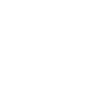

In [121]:
print(list(df_amenagement.geometry.iloc[4].coords))

df_amenagement.geometry.iloc[4]

# access to the points in the geometry

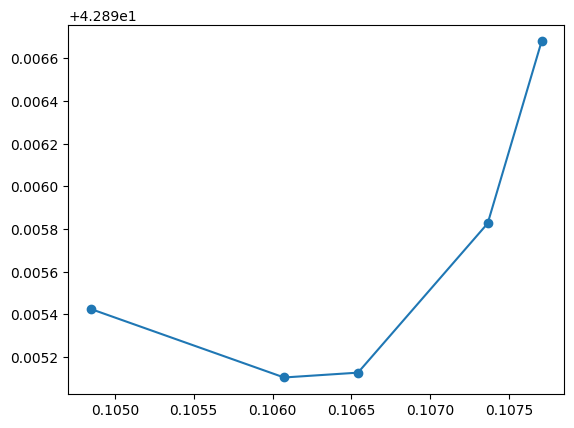

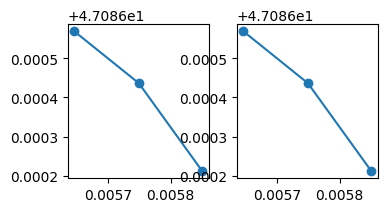

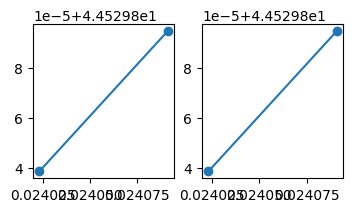

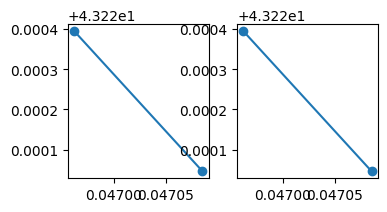

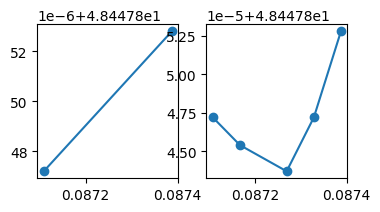

...

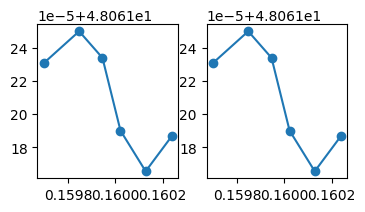

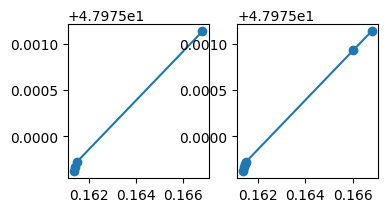

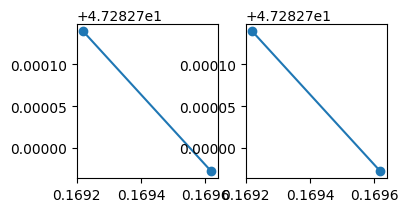

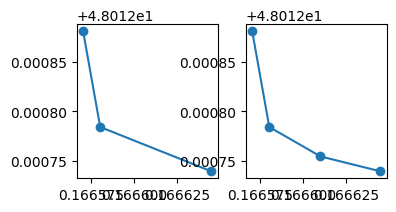

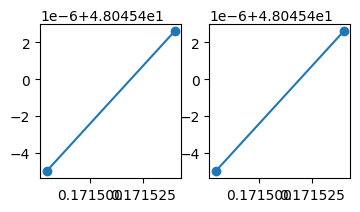

In [244]:
for i in range(20):
    fig, axes = plt.subplots(1,2,figsize=(4,2))
    axes[0].plot(df_amenagement.geometry.iloc[i].simplify(tolerance=1e-5).coords.xy[0], df_amenagement.geometry.iloc[i].simplify(tolerance=1e-5).coords.xy[1])
    axes[0].scatter(df_amenagement.geometry.iloc[i].simplify(tolerance=1e-5).coords.xy[0], df_amenagement.geometry.iloc[i].simplify(tolerance=1e-5).coords.xy[1])
    axes[1].plot(df_amenagement.geometry.iloc[i].coords.xy[0], df_amenagement.geometry.iloc[i].coords.xy[1])
    axes[1].scatter(df_amenagement.geometry.iloc[i].coords.xy[0], df_amenagement.geometry.iloc[i].coords.xy[1])
    plt.show()

In [258]:
# standardize the coordinates
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()


array([[-1.23844762, -1.23794731],
       [-0.67414276, -0.67514287],
       [ 0.65398902,  0.65512216],
       [ 1.25860136,  1.25796802]])

[0.93192665]
1


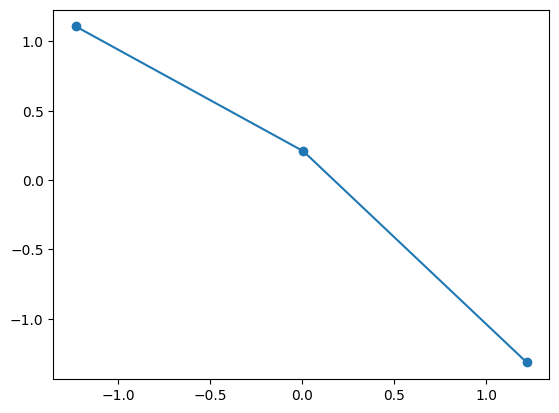

0


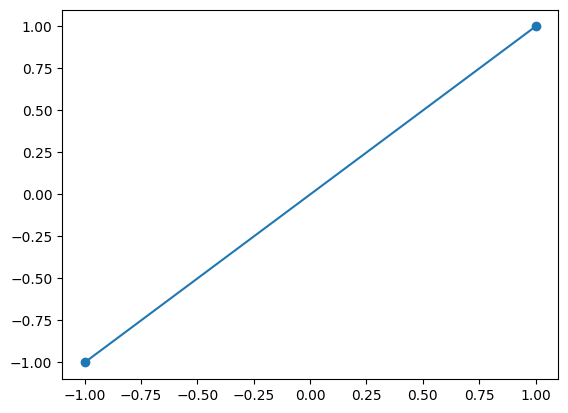

0


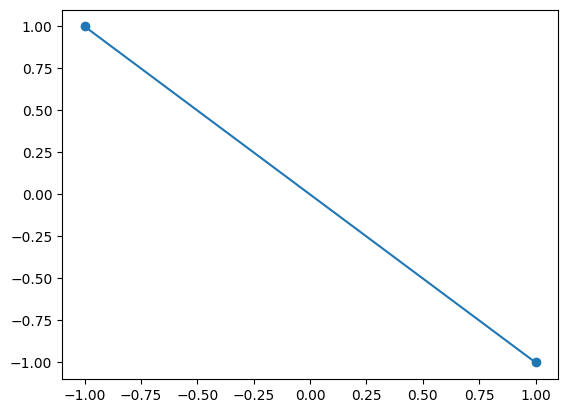

[0.01379264 0.07583745 0.03579363]
0


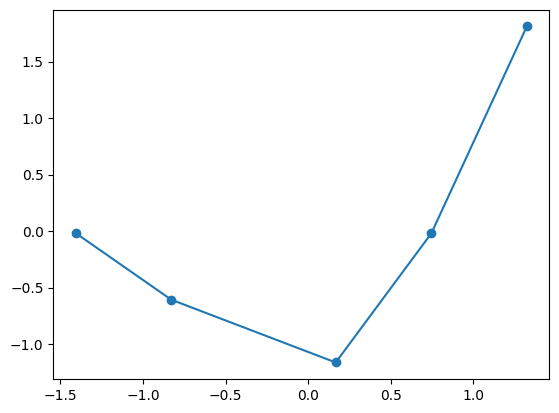

[-1.62337634e-03 -1.81868551e-04 -1.08225323e-02 -1.55381409e-02
 -1.06570942e-02 -4.52483882e-02  2.16821984e-01 -3.25189346e-03
  1.18286528e-01]
0


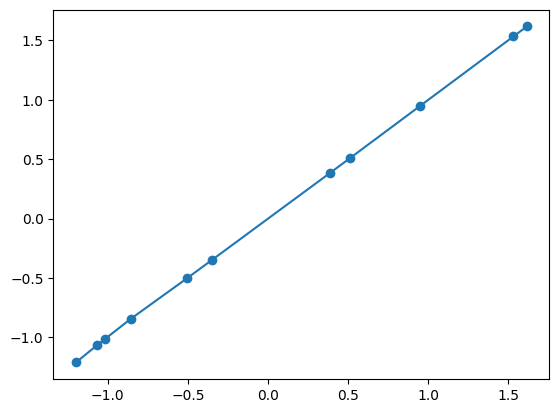

[ 5.05169796e-02  4.06410471e-02  1.10672984e-01  8.37340405e-02
  1.86106548e-01  1.57144969e-01  3.85059005e-01  2.58613503e-01
  4.77485145e-01 -7.13139715e-01 -1.91627738e-01  4.46951638e-01
  5.41959736e-01  5.76781963e-01  4.35727235e+01 -4.22701543e+01
 -1.75938777e+00 -3.70309964e-01]
2


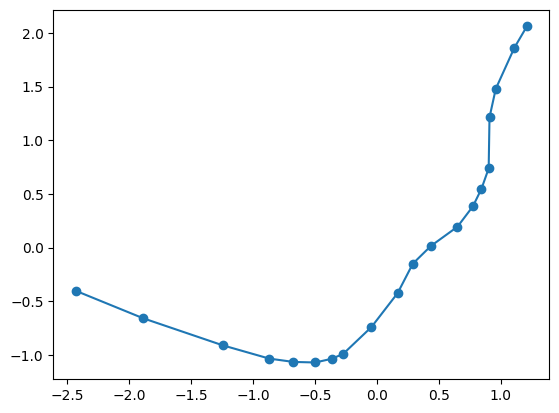

0


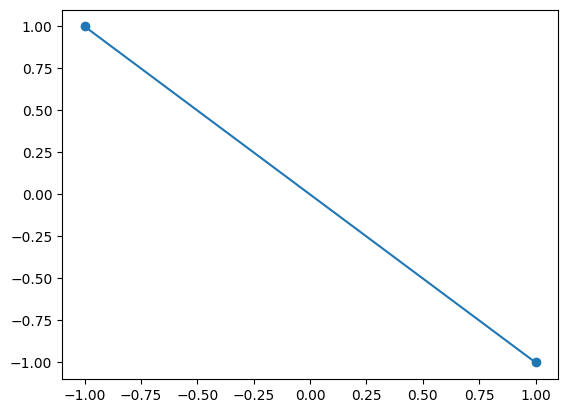

0


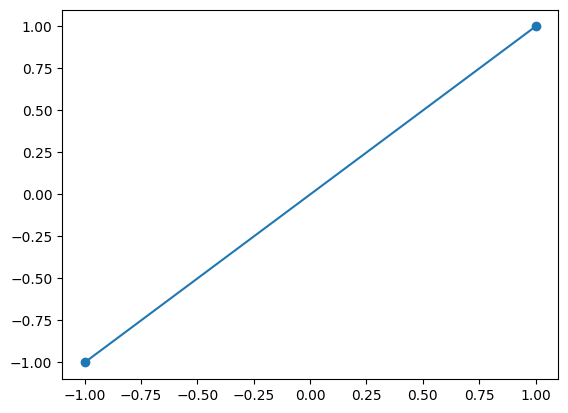

[  2.26105124 -34.28641001  -2.41304223   2.68084975  -7.82899938]
2


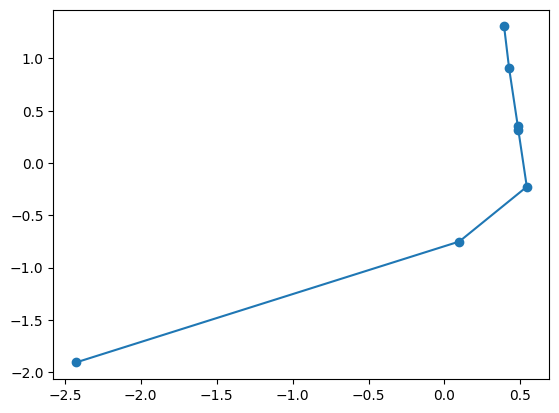

[-0.16913116 -0.33285569 -4.64366798 -7.96251995 18.4398827  -1.77560838
 -0.66568595 -0.94652797]
2


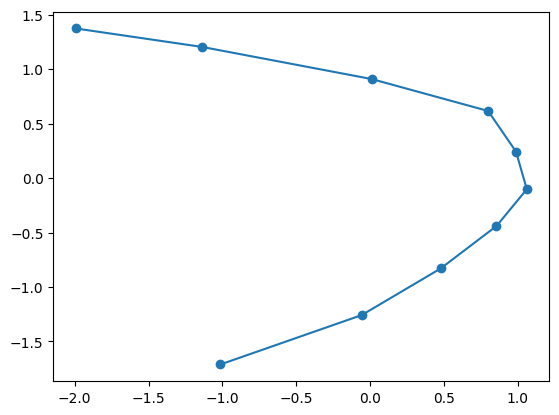

[-43.70751348]
-1


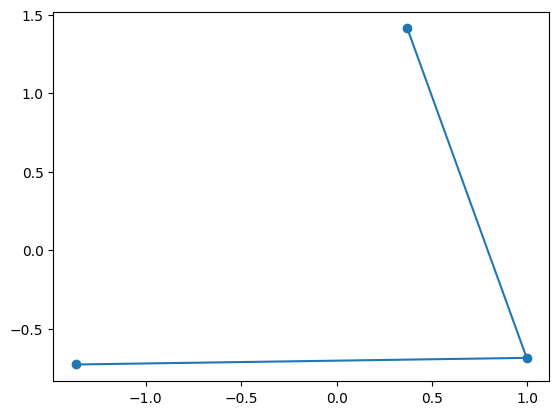

[-0.00530191 -0.42937956]
-1


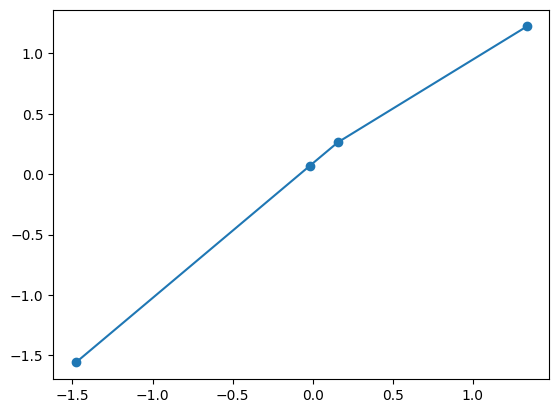

0


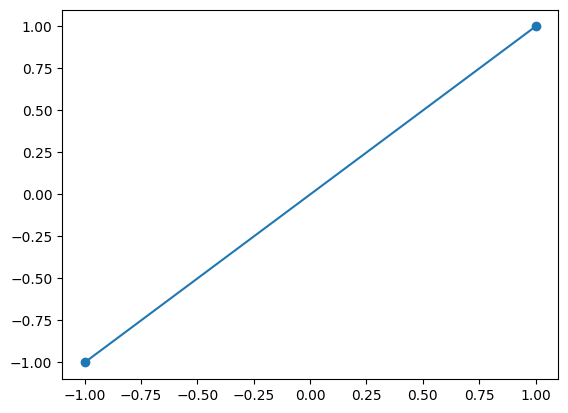

[0.78597597]
1


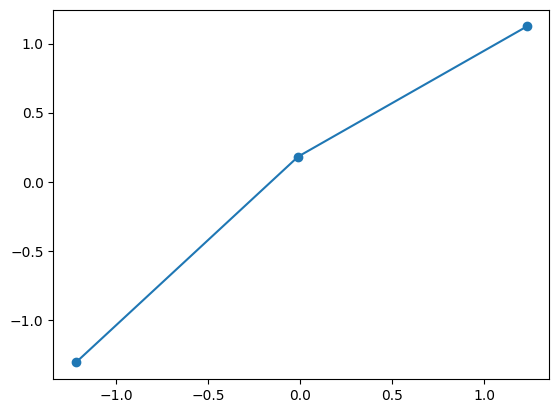

[ 2.20807961e-02 -2.82153695e-03  2.84818732e-03  8.28471952e-05
 -9.35960616e-03  2.25911593e-05  2.83953654e-04]
0


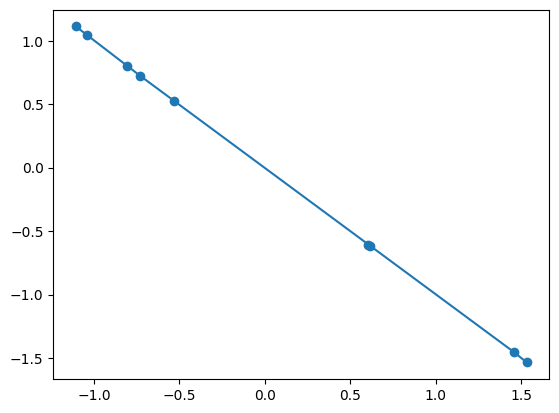

[-0.42269748 -0.3459018   0.41371557  0.29146952]
2


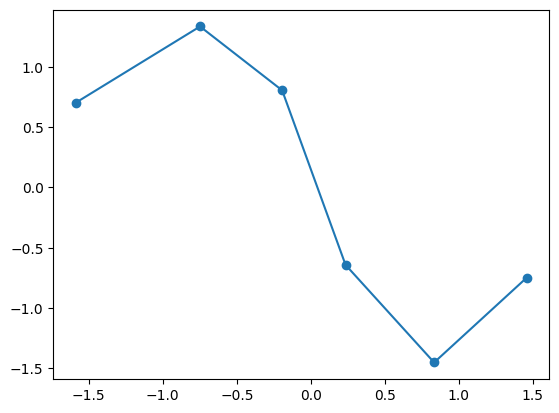

[ 1.01820799e-03  2.82889287e-01 -2.50793649e-02  2.27400468e+00]
1


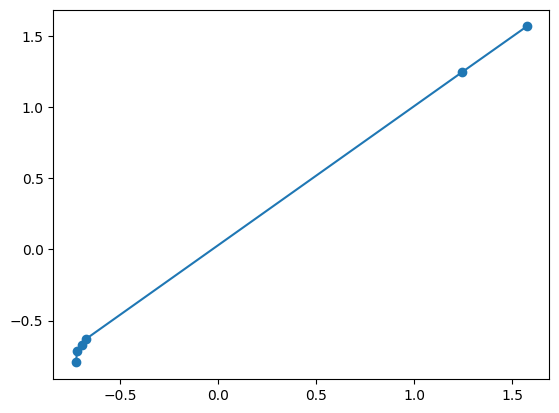

0


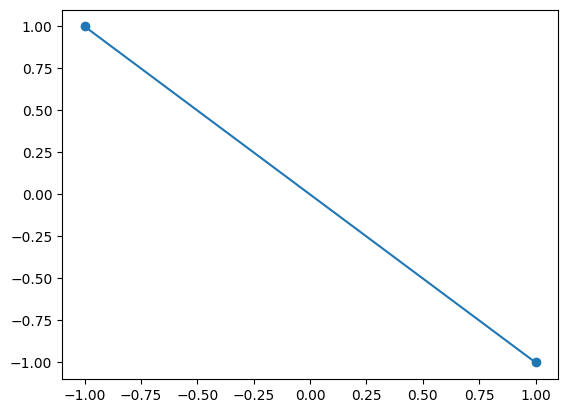

[-0.56772334 -8.76767677]
-1


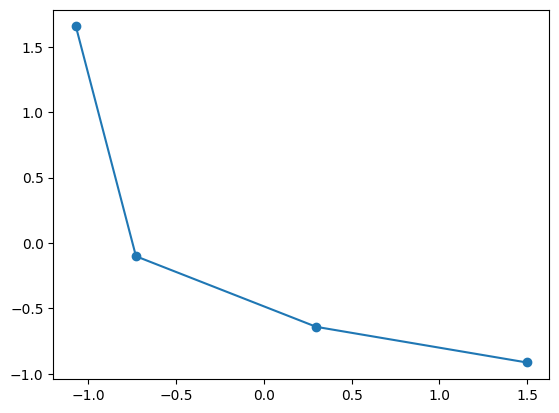

0


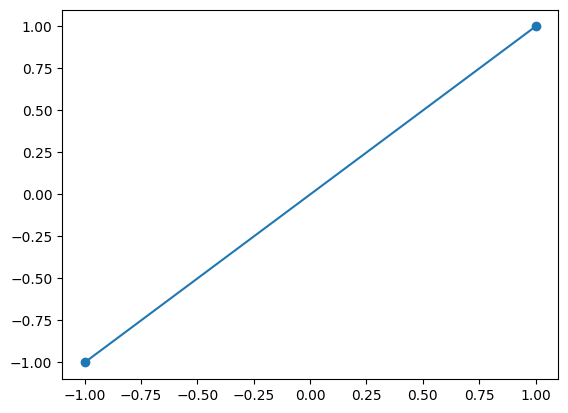

0


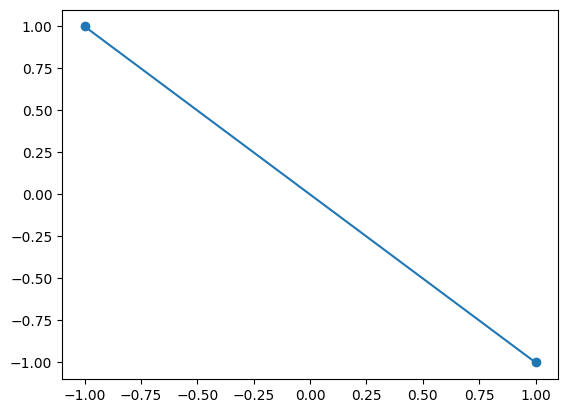

0


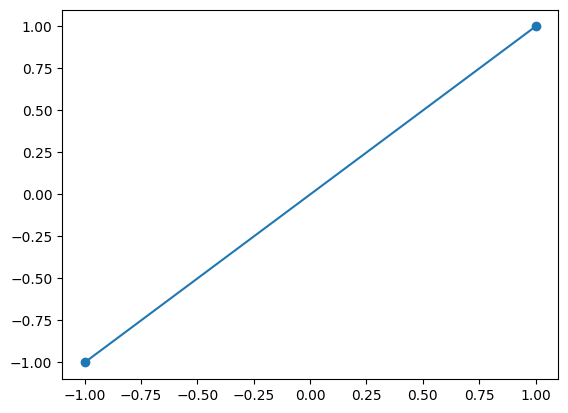

[-3.19298346]
-1


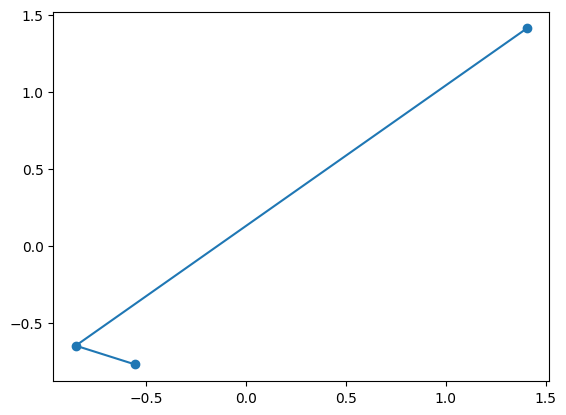

0


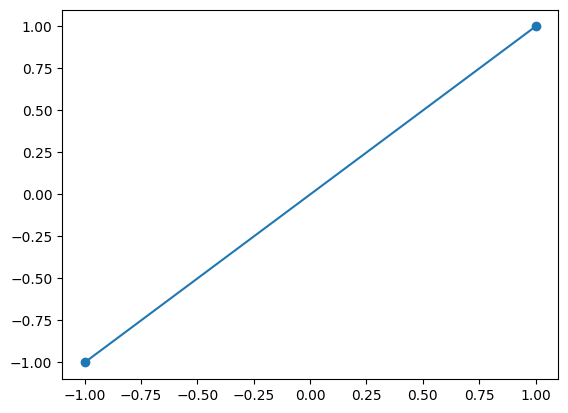

[0.11484662 0.08452068 0.09973099 0.11237531 0.09733607]
0


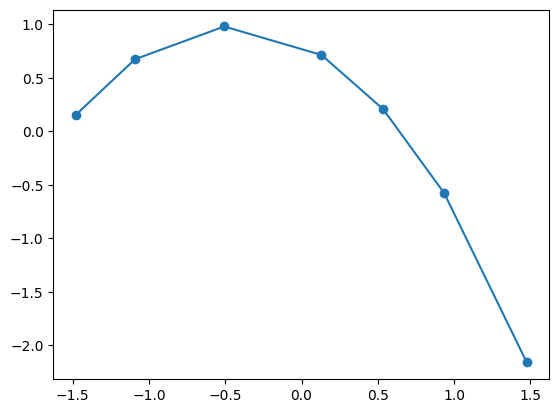

[-0.00085475]
0


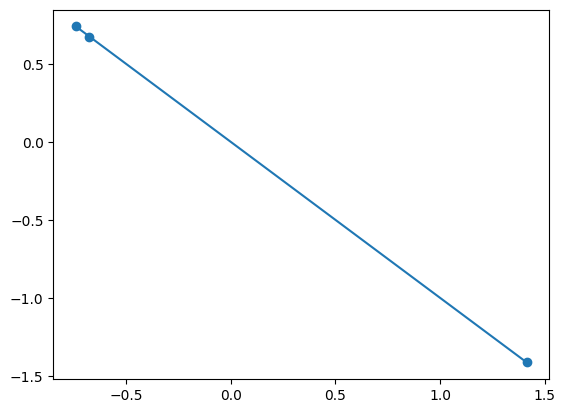

[-0.42920804 -1.0043956 ]
-1


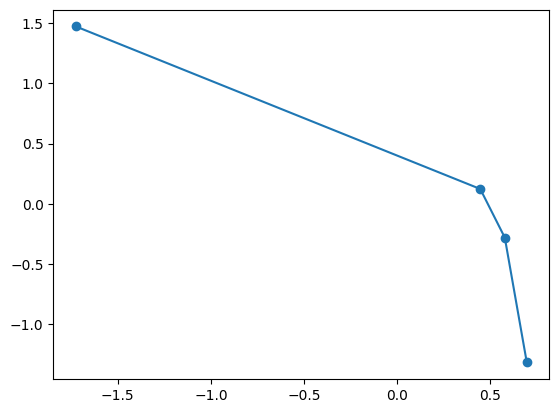

[ 5.66463505e+01 -5.20451578e+01 -7.73015259e-01  1.26015987e-02
 -1.07227167e-01 -3.14418573e-01 -6.40868761e-10]
2


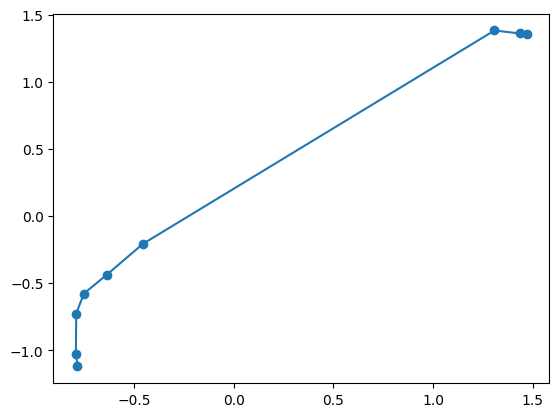

0


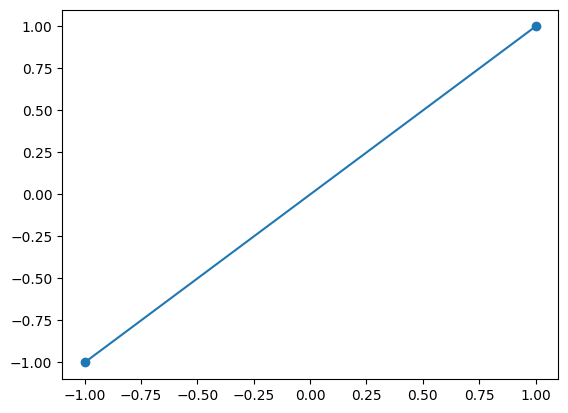

[ 0.00193204 -0.00205109]
0


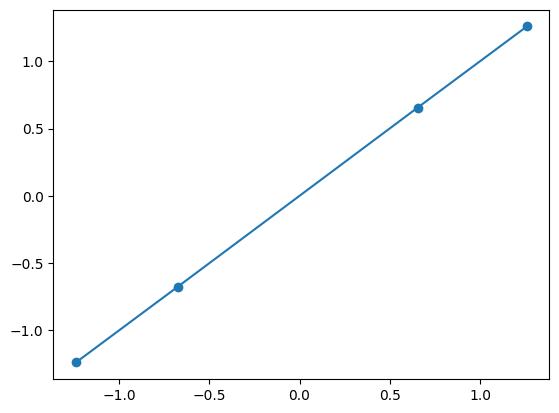

In [264]:
for i in range(30):
    l = list(df_amenagement.geometry.iloc[i].coords)
    new_l = np.apply_along_axis(lambda x: np.array(x), 0, l) 
    coords = scaler.fit_transform(new_l)
    plt.plot(coords[:,0], coords[:,1])
    plt.scatter(coords[:,0],coords[:,1])

    #plt.plot(df_amenagement.geometry.iloc[i].coords.xy[0], df_amenagement.geometry.iloc[i].coords.xy[1])
    #plt.scatter(df_amenagement.geometry.iloc[i].coords.xy[0], df_amenagement.geometry.iloc[i].coords.xy[1])
    l = list(df_amenagement.geometry.iloc[i].coords)
    virage = 0
    if len(l) > 2:
        new_l = np.apply_along_axis(lambda x: np.array(x), 0, l) 
        window = np.lib.stride_tricks.sliding_window_view(new_l, 2,axis=0)
        window = np.apply_along_axis(lambda x: x[1]-x[0], 2, window)
        window = np.apply_along_axis(lambda x: x[1]/x[0], 1, window)
        window = np.lib.stride_tricks.sliding_window_view(window, 2,axis=0)
        window = np.apply_along_axis(lambda x: x[1]-x[0], 1, window)
        print(window)
        # si window > 0 alors on est sur un virage à gauche plus ou moins fort
        # si window < 0 alors on est sur un virage à droite plus ou moins fort
        # si window = 0 alors on est sur une ligne droite
        virages = []
        seuil = 0.3
        for ele in window:
            if ele > seuil and (len(virages) == 0 or virages[-1] != 1):
                virages.append(1)
            elif ele < -seuil and (len(virages) == 0 or virages[-1] != -1):
                virages.append(-1)
        if len(virages) == 0:
            virage = 0 # droite
        elif len(virages) == 1:
            virage = virages[0]
        else:
            virage = 2
    print(virage)
    plt.show()

1


In [165]:
window

array([[[ 0.2388973,  0.2389344],
        [45.033987 , 45.0339768]],

       [[ 0.2389344,  0.2401346],
        [45.0339768, 45.0336458]]])

In [178]:
l = list(df_amenagement.geometry.iloc[i].coords)
np.apply_along_axis(lambda x: round(x[1]-x[0]), 1, np.lib.stride_tricks.sliding_window_view(v, 2))

array([   6,    0,   -6,    4,   -1,    0,   22,  138, -102,  -45])

In [122]:
def calculate_curvature(linestring): 
    x = [point[0] for point in linestring] 
    y = [point[1] for point in linestring] 
    dx = np.gradient(x) 
    dy = np.gradient(y) 
    ds = np.hypot(dx, dy) 
    d2x = np.gradient(dx) 
    d2y = np.gradient(dy)
    k = (d2y*dx - d2x*dy) / np.power(ds, 3)
    return k
v = calculate_curvature(list(df_amenagement.geometry.iloc[4].coords))
v

array([-5.78648860e+00, -1.00223740e-01, -1.31163156e-01, -5.66819817e+00,
       -1.86740804e+00, -2.63439808e+00, -2.72338213e+00,  1.89960716e+01,
        1.57023139e+02,  5.51901643e+01,  1.01795890e+01])

In [124]:
np.apply_along_axis(lambda x: round(x[1]-x[0]), 1, np.lib.stride_tricks.sliding_window_view(v, 2))

array([   6,    0,   -6,    4,   -1,    0,   22,  138, -102,  -45])

In [63]:
df_drop

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,larrout,vma,surf,catv,Num_Acc
0,1.0,0.0,0.0,2.0,2,590,11.0,0.0,2005-01-12,5051500.0,294400.0,0.0,1.0,2.0,6,NaN,0.0,7,200500000001
1,1.0,0.0,0.0,2.0,2,590,11.0,0.0,2005-01-12,5051500.0,294400.0,0.0,1.0,2.0,6,NaN,0.0,7,200500000001
2,1.0,0.0,3.0,2.0,0,590,51.0,0.0,2005-01-21,5053700.0,280200.0,0.0,0.0,2.0,10,NaN,0.0,7,200500000002
3,1.0,0.0,3.0,2.0,0,590,51.0,0.0,2005-01-21,5053700.0,280200.0,0.0,0.0,2.0,10,NaN,0.0,2,200500000002
9,1.0,1.0,0.0,2.0,2,590,478.0,0.0,2005-01-10,5096400.0,247500.0,3.0,1.0,2.0,5,NaN,1.0,7,200500000005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1734222,1.0,1.0,0.0,2.0,2,79,79079,0.0,2019-10-26,"46,9705850","-0,8721120",0.0,1.0,2.0,4,80.0,1.0,7,201900057484
1734497,1.0,0.0,0.0,3.0,0,79,79249,0.0,2019-08-18,"46,3663610","-0,4072240",1.0,1.0,2.0,6,70.0,1.0,7,201900057636
1735628,1.0,1.0,0.0,3.0,2,79,79049,0.0,2019-05-30,"46,8237870","-0,5067560",0.0,1.0,2.0,5,50.0,0.0,7,201900058308
1736280,1.0,0.0,0.0,2.0,2,79,79049,1.0,2019-12-02,"46,8324700","-0,4903300",0.0,1.0,2.0,6,50.0,0.0,31,201900058690


In [14]:
df_drop.vma.isna().sum()/len(df)

0.5489220858299798

In [10]:
4160/(4160+1840)

0.6933333333333334

In [11]:
# correlation matrix
corr = df_velo_acc_predictions.corr()
corr["grav"]


plan       0.129965
vosp      -0.094221
grav       1.000000
larrout   -0.056788
prof_1    -0.120820
prof_2     0.094108
prof_3     0.056915
prof_4     0.051809
int_0      0.154469
int_1     -0.154011
int_2     -0.032897
int_3      0.037002
Name: grav, dtype: float64

In [99]:
df_paris = df[(df.dep == 75) | (df.dep == 750) | (df.dep == "750") | (df.dep == "75")]
Num_Acc =  df_paris[df_paris["catv"] == 1]["Num_Acc"]
df_velo_acc = df_paris[df_paris["Num_Acc"].isin(list(Num_Acc))]
df_velo_acc.reset_index(drop=True, inplace=True)  

Accuracy: 0.5358938266639856
Brier score: 0.4641061733360145


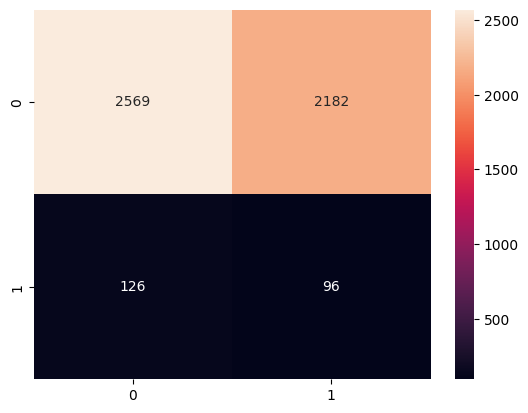

In [103]:
# train data = data before 2020
df_train = df_velo_acc[df_velo_acc["date"] < pd.to_datetime("2019-01-01").date()]

# test data = data after 2020
df_test = df_velo_acc[df_velo_acc["date"] >= pd.to_datetime("2019-01-01").date()]

columns_to_drop_for_predictions: list = [
    "dep",
    "com",
    "date",
    "lat",
    "long",
    "vma",
    "larrout",
    "catv",
    "Num_Acc"
]

df_train_predictions: pd.DataFrame = df_train.drop(columns=columns_to_drop_for_predictions)
df_test_predictions: pd.DataFrame = df_test.drop(columns=columns_to_drop_for_predictions)

selected_features = ["prof","plan","vosp","grav","lum","int","atm","circ","nbv","surf"]
for feature in selected_features:
    df_train_predictions[feature] = df_train_predictions[feature].astype("Int64")
    df_test_predictions[feature] = df_test_predictions[feature].astype("Int64")

df_train_predictions = df_train_predictions.dropna()
df_test_predictions = df_test_predictions.dropna()

features_to_one_hot = ["prof","int"]
df_train_predictions = pd.get_dummies(df_train_predictions, columns=features_to_one_hot)
df_test_predictions = pd.get_dummies(df_test_predictions, columns=features_to_one_hot)

X_train = df_train_predictions.drop(columns=["grav"])
y_train = df_train_predictions["grav"].astype("int").replace({1: 0, 2: 1, 3: 1})

X_test = df_test_predictions.drop(columns=["grav"])
y_test = df_test_predictions["grav"].astype("int").replace({1: 0, 2: 1, 3: 1})

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train.astype('int'), y_train.astype('int'))


# Create a Gaussian Classifier
clf = LogisticRegression()
clf.fit(X_train_smote, y_train_smote.astype('int'))
y_pred = clf.predict(X_test).astype('int')
print("Accuracy:", accuracy_score(y_test, y_pred))

from sklearn.metrics import brier_score_loss
print("Brier score:", brier_score_loss(y_test, y_pred, pos_label=1))

# confusion matrix with seaborn
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

In [112]:
X_smote

,plan,vosp,lum,atm,circ,nbv,surf,prof_1,prof_2,prof_3,prof_4,int_0,int_1,int_2,int_3
0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0
1,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0
2,1,0,0,2,1,0,0,1,0,0,0,1,0,0,0
3,1,0,0,2,1,0,0,1,0,0,0,1,0,0,0
4,0,0,0,0,1,2,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152958,0,2,1,0,0,2,0,1,0,0,0,0,1,0,0
152959,0,2,1,0,0,2,0,1,0,0,0,0,1,0,0
152960,0,2,0,1,0,1,0,0,1,0,0,1,0,0,0
152961,0,2,0,1,0,1,0,0,1,0,0,1,0,0,0


In [120]:
X_train

,plan,vosp,lum,atm,circ,nbv,surf,prof_1,prof_2,prof_3,prof_4,int_0,int_1,int_2,int_3
0,0,0,1,0,0,2,0,1,0,0,0,1,0,0,0
1,0,0,1,0,0,2,0,1,0,0,0,1,0,0,0
2,0,0,0,0,0,3,0,1,0,0,0,0,1,0,0
3,0,0,0,0,0,3,0,1,0,0,0,0,1,0,0
4,0,0,1,0,1,4,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17711,0,1,1,0,1,6,0,0,1,0,0,1,0,0,0
17712,0,1,1,0,1,6,0,0,1,0,0,1,0,0,0
17713,0,0,0,0,1,2,0,1,0,0,0,0,1,0,0
17714,0,0,0,0,1,2,0,1,0,0,0,0,1,0,0


In [126]:
df_paris

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,larrout,vma,surf,catv,Num_Acc
7808,1.0,0.0,0.0,2.0,0,750,20.0,0.0,2005-01-02,NaN,NaN,0.0,1.0,2.0,60,NaN,0.0,18,200500004569
7809,1.0,0.0,0.0,2.0,0,750,1.0,0.0,2005-01-02,NaN,NaN,0.0,0.0,3.0,90,NaN,0.0,7,200500004570
7810,1.0,0.0,0.0,1.0,1,750,18.0,1.0,2005-01-02,NaN,NaN,0.0,1.0,4.0,120,NaN,0.0,7,200500004571
7811,1.0,0.0,0.0,1.0,1,750,18.0,1.0,2005-01-02,NaN,NaN,0.0,1.0,4.0,120,NaN,0.0,7,200500004571
7812,1.0,0.0,0.0,2.0,1,750,7.0,0.0,2005-01-04,NaN,NaN,1.0,0.0,2.0,60,NaN,0.0,5,200500004572
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1914745,2.0,0.0,2.0,1.0,0,75,75110,0.0,2021-01-02,"48,8769050000","2,3665940000",1.0,0.0,1.0,-1,50.0,0.0,7,202100056424
1914746,2.0,0.0,2.0,1.0,0,75,75110,0.0,2021-01-02,"48,8769050000","2,3665940000",1.0,0.0,1.0,-1,50.0,0.0,1,202100056424
1914747,1.0,0.0,0.0,1.0,1,75,75110,0.0,2021-01-01,"48,8792160000","2,3686000000",0.0,0.0,2.0,-1,50.0,0.0,7,202100056425
1914748,1.0,0.0,0.0,1.0,1,75,75110,0.0,2021-01-01,"48,8792160000","2,3686000000",0.0,0.0,2.0,-1,50.0,0.0,30,202100056425


Accuracy: 0.6084902521791203


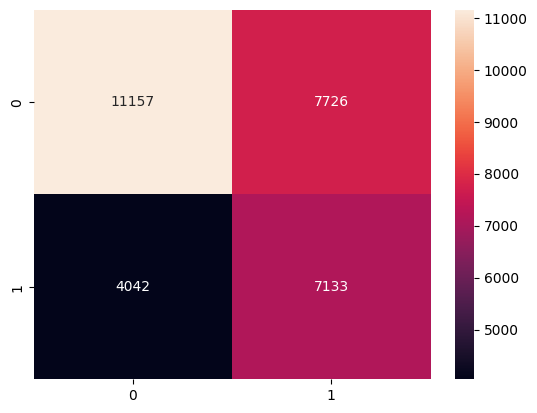

In [19]:
#df_paris = df[(df.dep == 75) | (df.dep == 750) | (df.dep == "750") | (df.dep == "75")]
Num_Acc =  df[df["catv"] == 1]["Num_Acc"]
df_velo_acc = df[df["Num_Acc"].isin(list(Num_Acc))]
df_velo_acc.reset_index(drop=True, inplace=True)  

columns_to_drop_for_predictions: list = [
    "dep",
    "com",
    "date",
    "lat",
    "long",
    "vma",
    "larrout",
    "catv",
    "Num_Acc",
    "surf",
    "lum",
    "atm"
]

df_velo_acc_predictions: pd.DataFrame = df_velo_acc.drop(columns=columns_to_drop_for_predictions)

selected_features = ["prof","plan","vosp","grav","int","circ","nbv"]
for feature in selected_features:
    df_velo_acc_predictions[feature] = df_velo_acc_predictions[feature].astype("Int64")

df_velo_acc_predictions = df_velo_acc_predictions.dropna()

features_to_one_hot = ["prof","int"]
df_velo_acc_predictions = pd.get_dummies(df_velo_acc_predictions, columns=features_to_one_hot)

X = df_velo_acc_predictions.drop(columns=["grav"])
y = df_velo_acc_predictions["grav"].astype("int").astype("int").replace({1: 0, 2: 1, 3: 1})

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train.astype('int'), y_train.astype('int'))

# Create a Gaussian Classifier
clf = LogisticRegression()
clf.fit(X_train_smote, y_train_smote.astype('int'))
y_pred = clf.predict(X_test).astype('int')
print("Accuracy:", accuracy_score(y_test, y_pred))

#from sklearn.metrics import brier_score_loss
#print("Brier score:", brier_score_loss(y_test, y_pred, pos_label=1))

# confusion matrix with seaborn
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

nombre de voie
profile de la route
plan de la route => geometry
intersection
type de circulation => sens_g, send_d
infra => ame_g, ame_d

In [34]:
df_amenagement.head(3)

,id_local,id_osm,num_iti,code_com_d,ame_d,regime_d,sens_d,largeur_d,local_d,statut_d,revet_d,code_com_g,ame_g,regime_g,sens_g,largeur_g,local_g,statut_g,revet_g,access_ame,date_maj,trafic_vit,lumiere,d_service,source,project_c,ref_geo,geometry
0,geovelo_429754890_86274,429754890,None,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,86274,AUTRE,EN AGGLOMERATION,UNIDIRECTIONNEL,NaN,None,EN SERVICE,LISSE,None,2020-07-28,30.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.00585 47.08621, 0.00575 47.08644..."
1,geovelo_618321946_47165,618321946,3:V80,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,47165,PISTE CYCLABLE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2018-08-20,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.02402 44.52984, 0.02409 44.52989)"
2,geovelo_320086926_65440,320086926,None,65440,VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,65440,VOIE VERTE,AUTRE,UNIDIRECTIONNEL,NaN,None,EN SERVICE,None,None,2015-09-16,5.0,None,None,Les contributeurs OpenStreetmap,4326,OpenStreetmap,"LINESTRING (0.04709 43.22005, 0.04696 43.22039)"


In [40]:
shapefile = gpd.read_file(r"C:\Users\flavi\OneDrive\Documents\Etudes\CentraleSupélec\SD10\Challenges - Etudes de cas\challenge_ia_accidentologie_velos\data\ROUTE500_3-0__SHP_LAMB93_FXX_2021-11-03\ROUTE500\1_DONNEES_LIVRAISON_2022-01-00175\R500_3-0_SHP_LAMB93_FXX-ED211\RESEAU_ROUTIER\NOEUD_ROUTIER.shp")
shapefile.head(3)

,ID_RTE500,NATURE,INSEE_COMM,geometry
0,BDCNDROU0000000022756756,Carrefour simple,2A041,POINT (1217804.700 6051107.400)
1,BDCNDROU0000000022756755,Carrefour simple,2A041,POINT (1218265.300 6051011.400)
2,BDCNDROU0000000022756752,Carrefour simple,2A041,POINT (1219434.600 6051089.000)


In [41]:
shapefile = gpd.read_file(r"C:\Users\flavi\OneDrive\Documents\Etudes\CentraleSupélec\SD10\Challenges - Etudes de cas\challenge_ia_accidentologie_velos\data\ROUTE500_3-0__SHP_LAMB93_FXX_2021-11-03\ROUTE500\1_DONNEES_LIVRAISON_2022-01-00175\R500_3-0_SHP_LAMB93_FXX-ED211\RESEAU_ROUTIER\NOEUD_COMMUNE.shp")
shapefile.head(3)

,ID_RTE500,INSEE_COMM,NOM_CHF,STATUT,NOM_COMM,SUPERFICIE,POPULATION,ID_ND_RTE,geometry
0,COMMUNE_0000000009760754,32216,Lourties-Monbrun,Commune simple,Lourties-Monbrun,950,164,BDCNDROU0000000022686283,POINT (500888.400 6265035.900)
1,COMMUNE_0000000009756744,47033,Beauregard,Commune simple,Boudy-de-Beauregard,1007,415,BDCNDROU0000000022541676,POINT (516373.100 6384881.700)
2,COMMUNE_0000000009760252,32009,Mairie d'Armous-et-Cau,Commune simple,Armous-et-Cau,933,88,BDCNDROU0000000022666323,POINT (473044.300 6278895.100)


In [42]:
shapefile = gpd.read_file(r"C:\Users\flavi\OneDrive\Documents\Etudes\CentraleSupélec\SD10\Challenges - Etudes de cas\challenge_ia_accidentologie_velos\data\ROUTE500_3-0__SHP_LAMB93_FXX_2021-11-03\ROUTE500\1_DONNEES_LIVRAISON_2022-01-00175\R500_3-0_SHP_LAMB93_FXX-ED211\RESEAU_ROUTIER\TRONCON_ROUTE.shp")
shapefile.head(3)

,ID_RTE500,VOCATION,NB_CHAUSSE,NB_VOIES,ETAT,ACCES,RES_VERT,SENS,NUM_ROUTE,RES_EUROPE,LONGUEUR,CLASS_ADM,geometry
0,BDCTRORO0000002223872684,Type autoroutier,b'2 chauss\xe9es',Sans objet,b'Rev\xeatu',Libre,Appartient,Double sens,A51,E712,3.18,Autoroute,"LINESTRING (894833.500 6265743.500, 894824.700..."
1,BDCTRORO0000000021530114,Type autoroutier,b'2 chauss\xe9es',Sans objet,b'Rev\xeatu',Libre,Appartient,Double sens,A51,E712,1.29,Autoroute,"LINESTRING (894051.200 6262805.500, 894038.500..."
2,BDCTRORO0000000021513443,Type autoroutier,b'2 chauss\xe9es',Sans objet,b'Rev\xeatu',b'A p\xe9age',Appartient,Double sens,A63,E5,0.32,Autoroute,"LINESTRING (340196.800 6276241.300, 340155.300..."


Accuracy: 0.6083976577056162


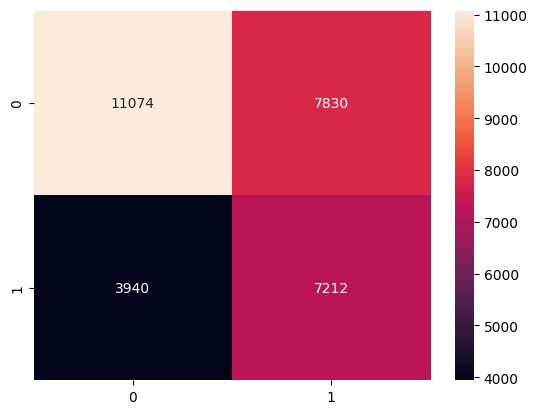

In [145]:
#df_paris = df[(df.dep == 75) | (df.dep == 750) | (df.dep == "750") | (df.dep == "75")]
Num_Acc =  df[df["catv"] == 1]["Num_Acc"]
df_velo_acc = df[df["Num_Acc"].isin(list(Num_Acc))]
df_velo_acc.reset_index(drop=True, inplace=True)  

columns_to_drop_for_predictions: list = [
    "dep",
    "com",
    "date",
    "lat",
    "long",
    "vma",
    "larrout",
    "catv",
    "Num_Acc",
    "surf"
]

df_velo_acc_predictions: pd.DataFrame = df_velo_acc.drop(columns=columns_to_drop_for_predictions)

selected_features = ["prof","plan","vosp","grav","int","circ","nbv","lum","atm"]
for feature in selected_features:
    df_velo_acc_predictions[feature] = df_velo_acc_predictions[feature].astype("Int64")

df_velo_acc_predictions = df_velo_acc_predictions.dropna()

features_to_one_hot = ["prof","int"]
df_velo_acc_predictions = pd.get_dummies(df_velo_acc_predictions, columns=features_to_one_hot)

X = df_velo_acc_predictions.drop(columns=["grav"])
y = df_velo_acc_predictions["grav"].astype("int").astype("int").replace({1: 0, 2: 1, 3: 1})

# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train.astype('int'), y_train.astype('int'))

# Create a Gaussian Classifier
clf = LogisticRegression()
clf.fit(X_train_smote, y_train_smote.astype('int'))
y_pred = clf.predict(X_test).astype('int')
print("Accuracy:", accuracy_score(y_test, y_pred))

#from sklearn.metrics import brier_score_loss
#print("Brier score:", brier_score_loss(y_test, y_pred, pos_label=1))

# confusion matrix with seaborn
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

In [144]:
X_train

,plan,vosp,circ,nbv,prof_1,prof_2,prof_3,prof_4,int_0,int_1,int_2,int_3
29816,0,0,2,2,1,0,0,0,0,1,0,0
58720,0,0,1,2,1,0,0,0,0,1,0,0
142754,1,3,0,2,1,0,0,0,0,0,1,0
56500,0,0,1,2,1,0,0,0,1,0,0,0
50408,0,0,1,2,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
120607,0,0,0,1,1,0,0,0,1,0,0,0
104099,0,0,1,0,1,0,0,0,1,0,0,0
133387,1,0,1,1,1,0,0,0,0,0,0,1
149315,0,2,0,1,1,0,0,0,1,0,0,0


In [142]:
# correlation matrix
corr = df_velo_acc_predictions.corr()
corr["grav"]

plan      0.107971
vosp     -0.102870
grav      1.000000
lum       0.010088
atm       0.031998
circ      0.111086
nbv      -0.073503
prof_1   -0.110509
prof_2    0.089389
prof_3    0.041742
prof_4    0.048037
int_0     0.126713
int_1    -0.127732
int_2    -0.022104
int_3     0.024115
Name: grav, dtype: float64

In [137]:
X_train

,plan,vosp,lum,atm,circ,nbv,surf,prof_1,prof_2,prof_3,prof_4,int_0,int_1,int_2,int_3
121408,0,0,0,0,1,5,0,1,0,0,0,0,1,0,0
125799,0,3,1,0,2,2,0,1,0,0,0,1,0,0,0
19902,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
25471,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
41727,0,0,0,0,1,3,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120616,0,0,0,0,1,2,0,1,0,0,0,0,1,0,0
104108,0,0,0,0,1,2,0,1,0,0,0,1,0,0,0
133400,0,0,0,1,1,2,0,1,0,0,0,1,0,0,0
149334,0,0,0,0,1,3,0,1,0,0,0,1,0,0,0


In [131]:
# precision
from sklearn.metrics import precision_score
#recall 
from sklearn.metrics import recall_score
#f1 score
from sklearn.metrics import f1_score
print(precision_score(y_test, y_pred, average='macro'),
    recall_score(y_test, y_pred, average='macro'),
    f1_score(y_test, y_pred, average='macro'))

0.6056768636857771 0.6133167139380653 0.5999918520046763


In [128]:
191/(136+191)

0.5840978593272171

In [89]:
3330/(3330+1963)

0.6291328169280181

In [85]:
# xgboost
import xgboost as xgb
from xgboost import XGBClassifier


In [78]:
3332/(3332+1961)

0.6295106744757226

In [79]:
df_predicted = df_paris.iloc[X_test.index,:]
y_pred = clf.predict_proba(X_test)[:,0]
df_predicted["predicted"] = y_pred
df_predicted_dropna = df_predicted.dropna(subset=["lat","long"])
df_predicted_dropna["lat"] = df_predicted_dropna["lat"].apply(lambda x: str(x).replace(",",".")).astype("float")
df_predicted_dropna["long"] = df_predicted_dropna["long"].apply(lambda x: str(x).replace(",",".")).astype("float")
df_predicted_dropna.head(3)

,prof,plan,vosp,grav,lum,dep,com,int,date,lat,long,atm,circ,nbv,larrout,vma,surf,catv,Num_Acc,predicted
134011,1.0,1.0,0.0,1.0,0,59,59143,1.0,2020-03-05,50.678500,2.874200,0.0,1.0,3.0,-1,50.0,0.0,7,202000000011,0.514133
134012,1.0,1.0,0.0,1.0,0,59,59143,1.0,2020-03-05,50.678500,2.874200,0.0,1.0,3.0,-1,50.0,0.0,1,202000000011,0.514133
134013,1.0,1.0,3.0,1.0,0,51,51454,2.0,2020-03-07,49.255646,4.061195,0.0,1.0,2.0,-1,50.0,0.0,1,202000000014,0.543140


In [80]:
import folium
from folium.plugins import MarkerCluster

def make_map(df):
    #Create the base Map
    m = folium.Map(location=[48.866667,2.333333], tiles='OpenStreetMap', zoom_start=12)

    #markerCluster = MarkerCluster().add_to(m)
    for i, row in df.iterrows():
        lat = df.at[i,'lat']
        lng = df.at[i,'long']

        risk = df.at[i,'predicted']
        if risk > 0.8:
            color = 'green'
        elif risk > 0.6:
            color = 'lightgreen'
        elif risk > 0.4:
            color = 'orange'
        elif risk > 0.2:
            color = 'lightred'
        else:
            color = 'red'
            
        folium.CircleMarker(location=[lat, lng], radius=2, popup=risk, color=color, fill_color=color).add_to(m)

    m.save("bike_counts_by_day.html")
print("saving map")
make_map(df_predicted_dropna)

saving map


In [21]:
columns_to_drop_for_predictions: list = [
    "dep",
    "com",
    "date",
    "lat",
    "long",
    "vma",
    "larrout"
]

df_predictions: pd.DataFrame = df.drop(columns=columns_to_drop_for_predictions)

selected_features = ["prof","plan","vosp","grav","lum","int","atm","circ","nbv","surf"]
for feature in selected_features:
    df_predictions[feature] = df_predictions[feature].astype("Int64")

In [22]:
missing(df_predictions)

prof => 3415 [0.18%]
plan => 4104 [0.21%]
vosp => 6715 [0.35%]
grav => no missing values [0%]
lum => no missing values [0%]
int => 180 [0.01%]
atm => 145 [0.01%]
circ => 17308 [0.9%]
nbv => 4754 [0.25%]
surf => 3416 [0.18%]


In [23]:
df_predictions_imputed = df_predictions.dropna()

In [25]:
features_to_one_hot = ["prof","int"]
df_predictions_one_hot = pd.get_dummies(df_predictions_imputed, columns=features_to_one_hot)

In [26]:
# train test split
df_predictions_cleaned = df_predictions_one_hot.copy(deep=True)
df_predictions_cleaned["grav"] = df_predictions_cleaned["grav"].replace({1: 0, 2: 1, 3: 1})

train_df, test_df = train_test_split(df_predictions_cleaned, test_size=0.3, random_state=42)

X_train = train_df.drop(columns=["grav"])
y_train = train_df["grav"].astype('int')

X_test = test_df.drop(columns=["grav"])
y_test = test_df["grav"].astype('int')

In [27]:
# model
model = LogisticRegression(class_weight="balanced")
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

0.6136604100979749


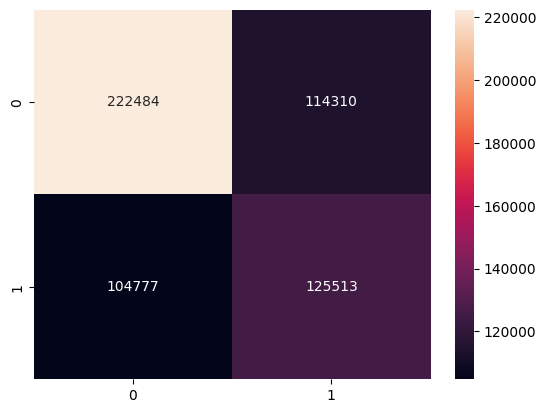

In [28]:
# confusion matrix with seaborn
y_pred = model.predict(X_test)
cm = confusion_matrix(y_test.astype('int'), y_pred)
sns.heatmap(cm, annot=True, fmt="d")
plt.show()

In [ ]:
# smote
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [ ]:
# model
model = LogisticRegression()
model.fit(X_train_smote, y_train_smote)
print(model.score(X_test, y_test))

In [15]:
# faire un échantillon de 100K lignes de train_df
def get_sample(df: pd.DataFrame, n: int) -> pd.DataFrame:
    return df.sample(n=n, random_state=42)
train_df_sample = get_sample(train_df, 100000)

In [16]:
X_train_sample = train_df_sample.drop(columns=["grav"])
y_train_sample = train_df_sample["grav"].astype('int')

# smote
smote = SMOTE(random_state=42)
X_train_smote_sample, y_train_smote_sample = smote.fit_resample(X_train_sample, y_train_sample)

TypeError: cannot safely cast non-equivalent float64 to int64

In [ ]:
# model
model = LogisticRegression()
model.fit(X_train_smote_sample, y_train_smote_sample)
print(model.score(X_test, y_test))

In [12]:
# model
model = MLPClassifier(alpha=1)
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

0.6519810116314337


In [13]:
# model
model = GaussianNB()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

0.6260060237989433


In [ ]:
# model
model = LogisticRegression()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

In [ ]:
# model
model = LogisticRegression()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

In [ ]:
# model
model = LogisticRegression()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

In [ ]:
# model
model = LogisticRegression()
model.fit(X_train, y_train)
print(model.score(X_test, y_test))

In [ ]:
# test all classifiers
classifiers = [
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    GradientBoostingClassifier(),
    LogisticRegression(),
    BaggingClassifier(),
    ExtraTreesClassifier(),
    MLPClassifier(alpha=1),
    LinearDiscriminantAnalysis(),
    QuadraticDiscriminantAnalysis(),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    VotingClassifier(estimators=[('lr', LogisticRegression()), ('rf', RandomForestClassifier()), ('gnb', GaussianNB())], voting='hard'),
    KNeighborsClassifier(3),
    SVC(kernel="rbf", C=0.025, probability=True),
    AdaBoostClassifier(),
    GaussianNB()
]

for clf in classifiers:
    clf.fit(X_train, y_train)
    name = clf.__class__.__name__
    print("="*30)
    print(name)
    print('****Results****')
    train_predictions = clf.predict(X_test)
    acc = accuracy_score(y_test, train_predictions)
    print("Accuracy: {:.4%}".format(acc))

DecisionTreeClassifier
****Results****
Accuracy: 66.0921%
RandomForestClassifier
****Results****
Accuracy: 66.0914%


KeyboardInterrupt: 